In [1]:
import xarray as xr
import dask
import numpy as np
from datetime import datetime, timedelta
from cartopy.feature.nightshade import Nightshade
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import os, glob, sys, gc
import tqdm.auto as tqdm
import pandas as pd

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import argparse
import glob
import os
from datetime import timedelta

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as colors

import numpy as np
import xarray as xr

import importlib

In [3]:
from dask_jobqueue import PBSCluster
from dask.distributed import Client

In [4]:
from dask.diagnostics import ProgressBar

In [5]:
sys.path.append('/glade/u/home/abukowski/SAMI3-GITM-python/')

In [6]:
import utility_programs.filters as filters
from utility_programs.plotting_routines import panel_plot
from utility_programs.read_routines.GITM import auto_read as auto_read_gitm
from utility_programs.read_routines.GITM import gitm_times_from_filelist
from utility_programs.read_routines.SAMI import auto_read as auto_read_sami
from utility_programs import plotting_routines
from utility_programs.utils import ut_to_lt

/glade/u/home/abukowski/SAMI3-GITM-python/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [7]:
cluster = PBSCluster(n_workers=4, )
cluster.adapt(maximum=1)
client = Client(cluster)
client

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44559 instead
  warnings.warn(


Connection method: Cluster object,Cluster type: dask_jobqueue.PBSCluster
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abukowski/proxy/44559/status,
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abukowski/proxy/44559/status,Workers: 0
Total threads: 0,Total memory: 0 B
Comm: tcp://10.148.0.2:33523,Workers: 0
Dashboard: https://jupyterhub.hpc.ucar.edu/stable/user/abukowski/proxy/44559/status,Total threads: 0
Started: Just now,Total memory: 0 B


# Compare the 2DANC JH & THM JH

In [8]:
may = xr.open_mfdataset(glob.glob('/glade/u/home/abukowski/scratch/postprocessed/may*thm_GITM.nc')[0], engine='h5netcdf')
nov = xr.open_mfdataset(glob.glob('/glade/u/home/abukowski/scratch/postprocessed/nov*thm_GITM.nc')[0], engine='h5netcdf')


Vars with "Heating" or "Cooling" in the name:

In [9]:
[k for k in may.data_vars if 'heating' in k.lower() or 'cooling' in k.lower()]

['EUVHeating',
 'ChemicalHeating',
 'AuroralHeating',
 'JouleHeating',
 'NOCooling',
 'OCooling',
 'AltIntJouleHeating_W_m2',
 'AltIntHeatingTransfer_W_m2',
 'AltIntEuvHeating_W_m2',
 'AltIntPhotoElectronHeating_W_m2',
 'AltIntChamicalHeating_W_m2',
 'AltIntRadCooling_W_m2',
 'AltIntCO2Cooling_W_m2',
 'AltIntNOCooling_W_m2',
 'AltIntOCooling_W_m2']

In [10]:
   
def make_alt_int_plots(data_array, colname, month):
    
    if 'Alt' in colname:
        vmin = data_array.min().compute()
        vmax = data_array.max().compute()
        
        suptitle='GITMs_'+colname+' From Run in ' + month

        fig = plotting_routines.loop_panels(data_array.compute(), 3, start_time=data_array.time.isel(time=414).values,
                                            time_delta='2 hours', suptitle=suptitle, cmap='rainbow', vmin=vmin, vmax=vmax*0.6)

    else:
        da = data_array.integrate('alt')
        vmin = da.min().compute()
        vmax = da.max().compute()
        suptitle='MY_'+colname+' From Run in ' + month
        
        fig = plotting_routines.loop_panels(da, 3, start_time=da.time.isel(time=414).values, time_delta='2 hours',
                                      suptitle=suptitle, cmap='rainbow', vmin=vmin, vmax=vmax*0.6)
    fig.tight_layout()
    # fig.show()
    fig.savefig('/glade/u/home/abukowski/plots/AllHeatingCooling/'+suptitle[:suptitle.find(' ')] + '_in_'+month)

    return fig

/glade/u/home/abukowski/SAMI3-GITM-python/utility_programs/plotting_routines.py:324: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=[4*hemi_titles.shape[1], 4*hemi_titles.shape[0]])


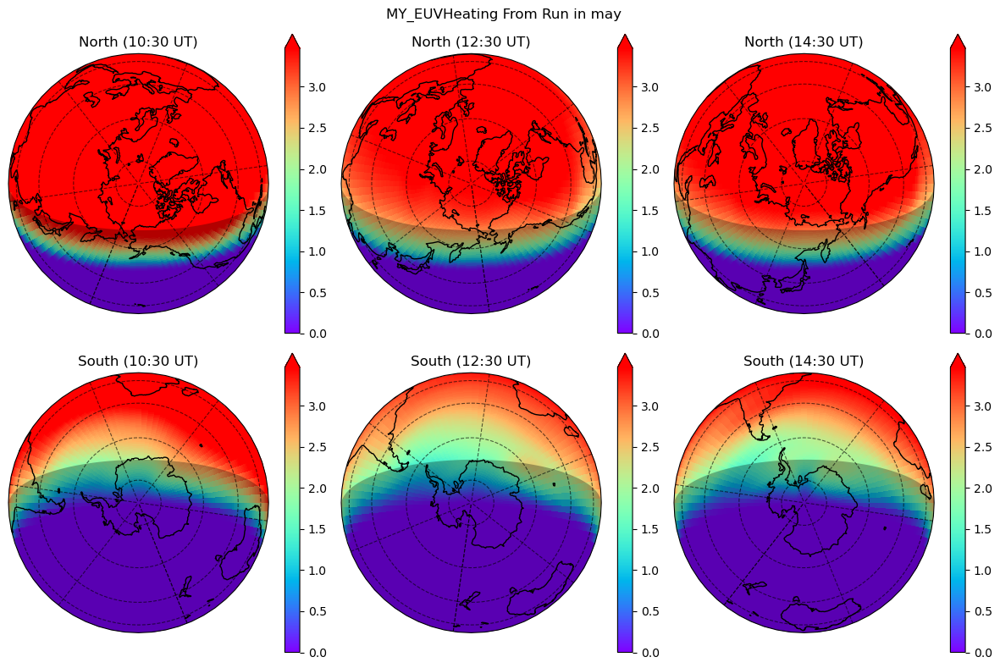

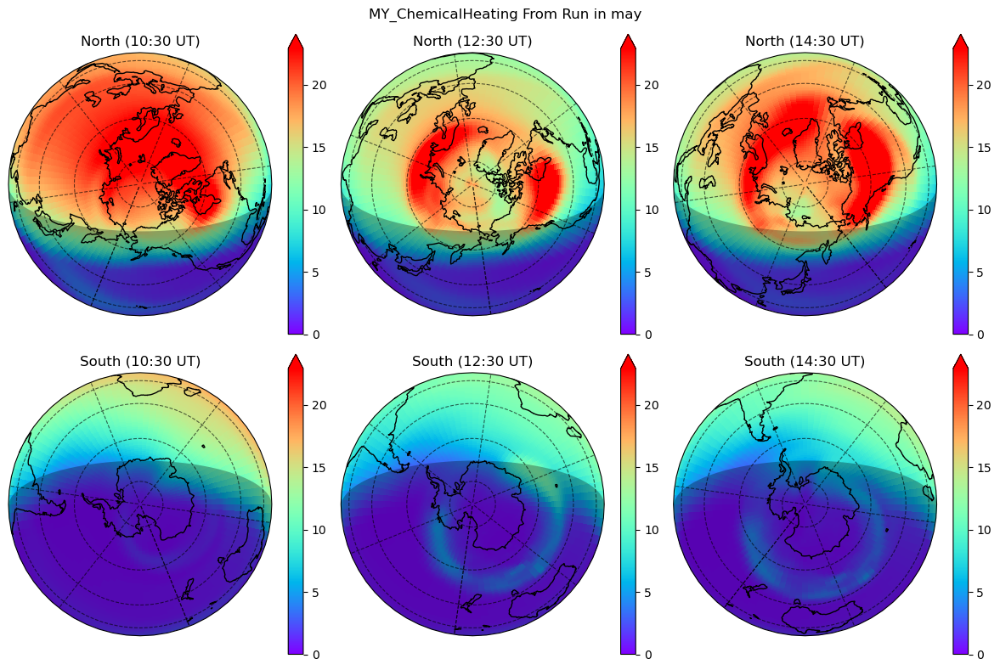

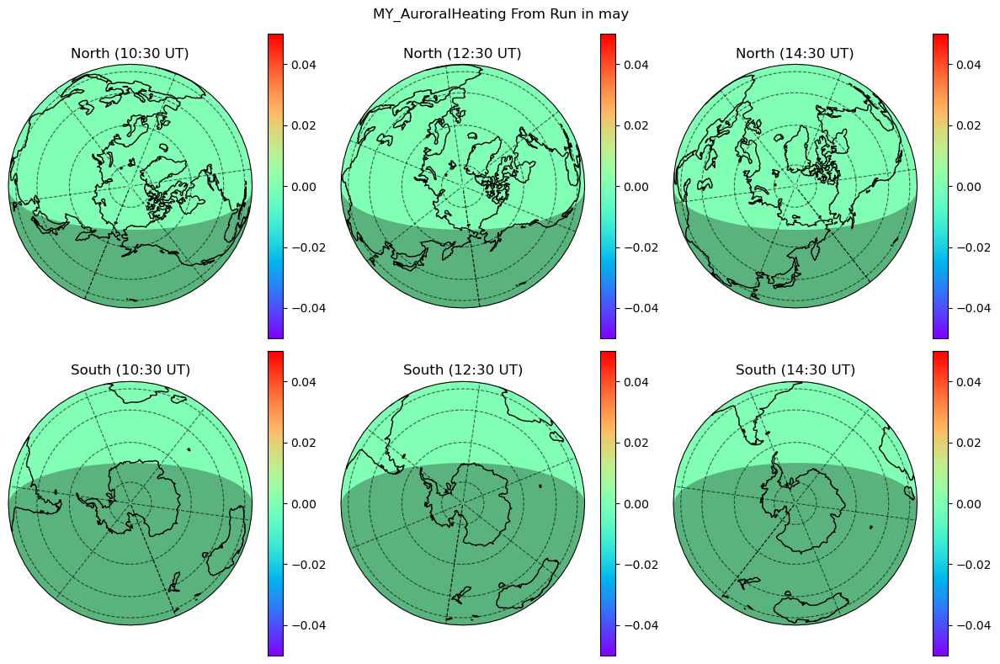

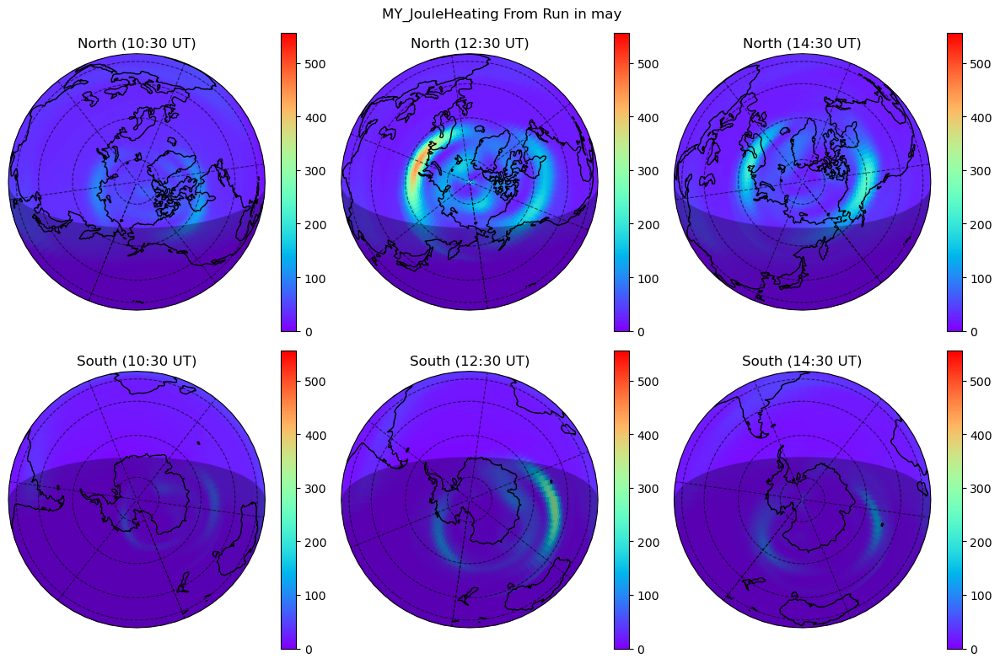

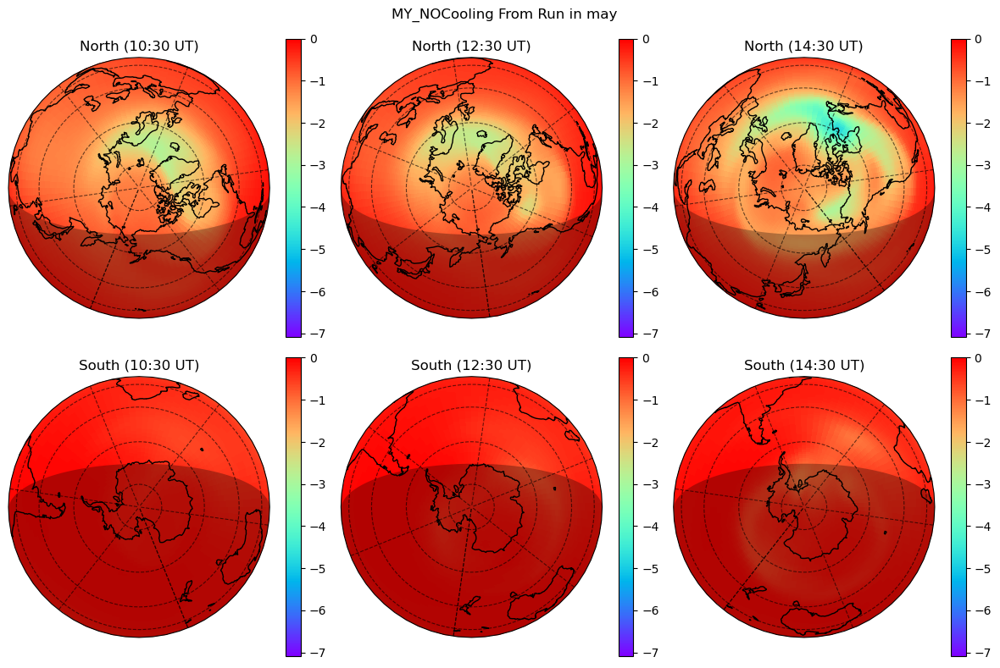

...

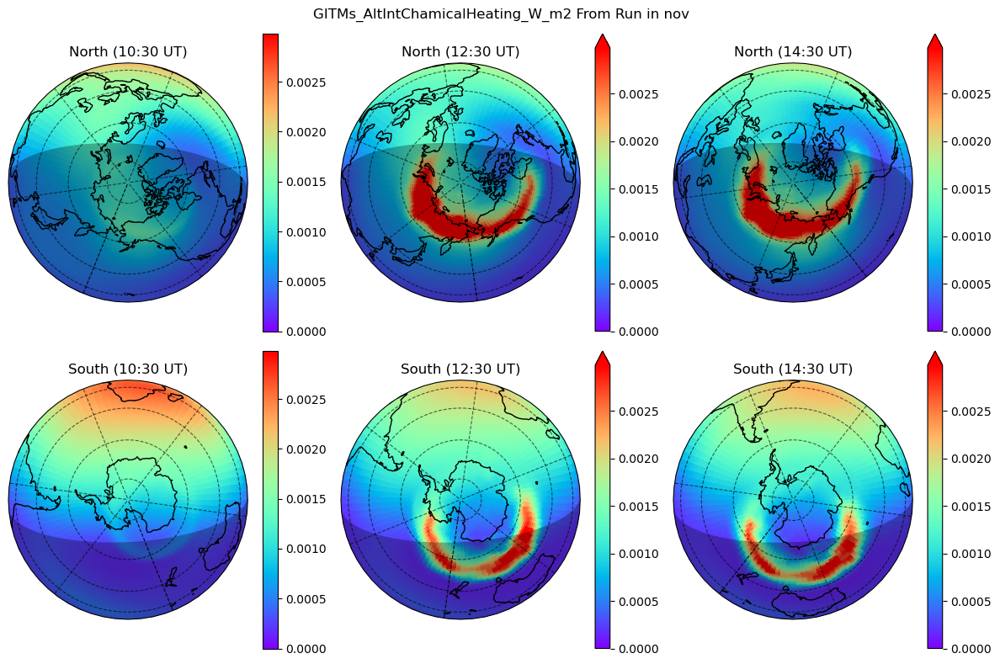

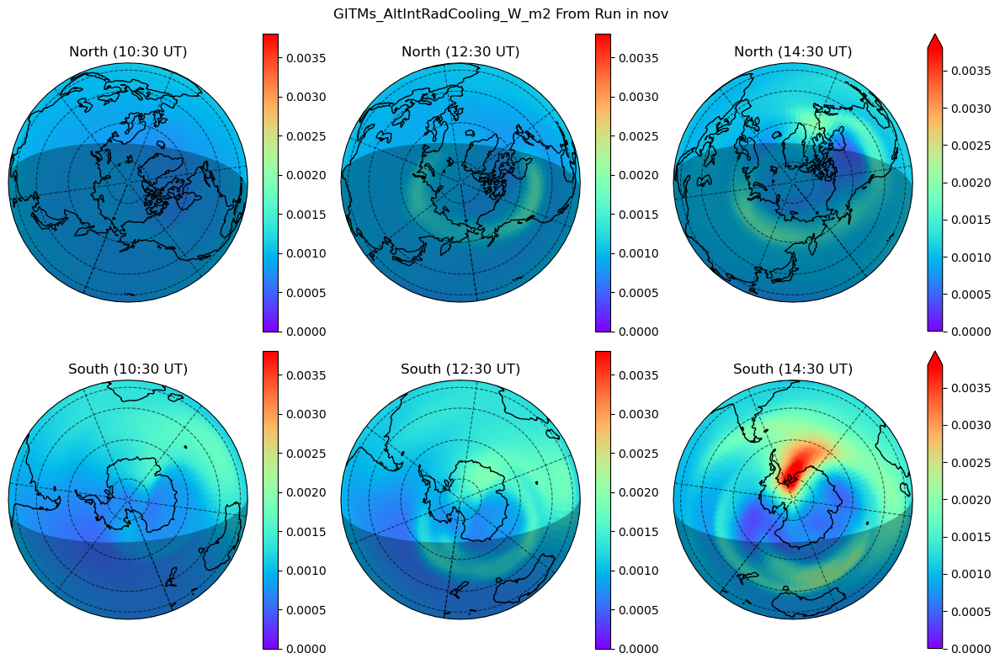

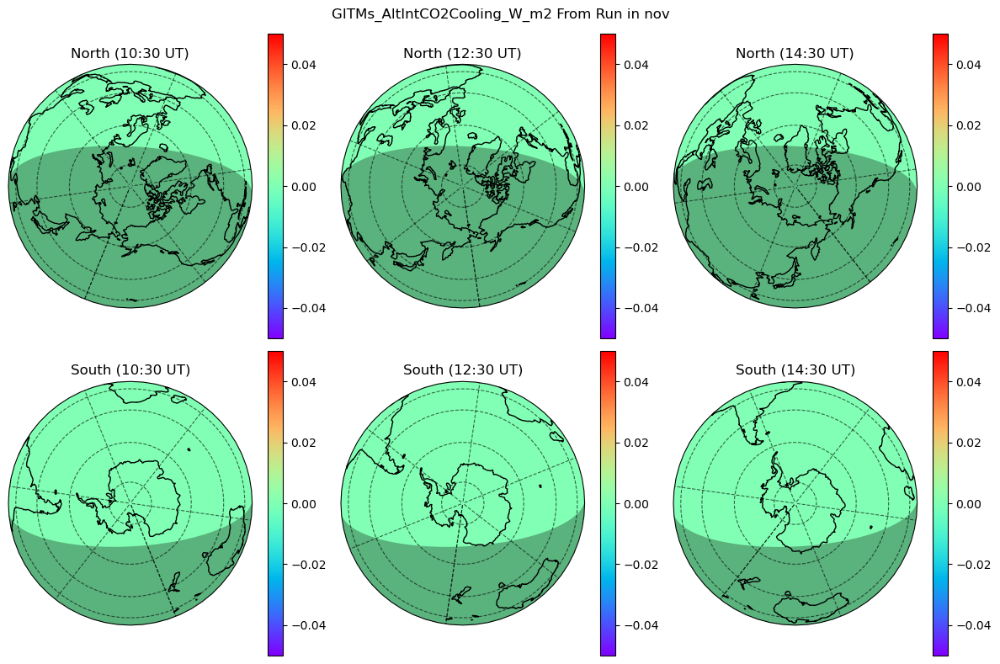

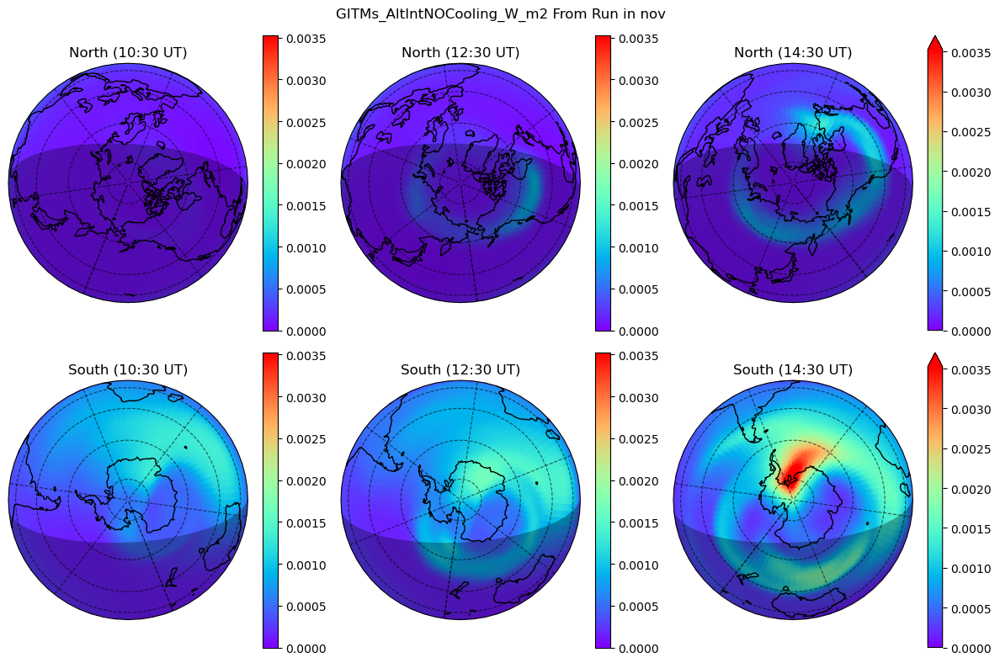

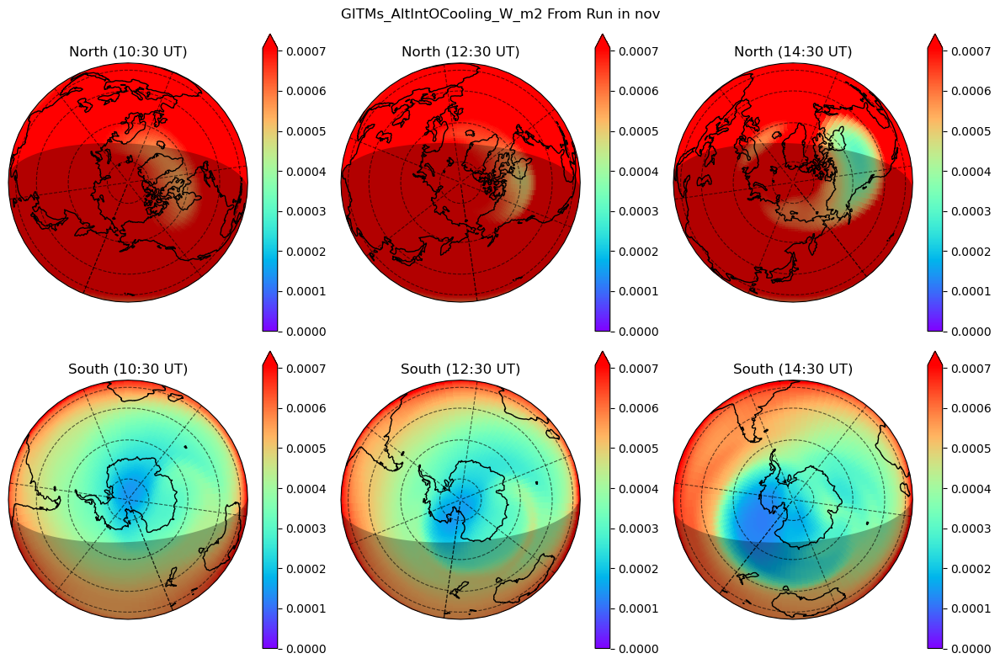

In [11]:
out_plots = []


for col in may.data_vars:
    if 'Heating' in col or 'Cooling' in col:
        out_plots.append(make_alt_int_plots(may[col], col, 'may'));

for col in nov.data_vars:
    if 'Heating' in col or 'Cooling' in col:
        out_plots.append(make_alt_int_plots(nov[col], col, 'nov'));